In [1]:
import numpy as np
import pandas as pd

In [2]:
factory_data = pd.read_csv('Data/factory_data (classification).csv', index_col=0)

# Looking at the Data #

In [3]:
factory_data.head()

,Product ID,Quality,Ambient T (C),Process T (C),Rotation Speed (rpm),Torque (Nm),Tool Wear (min),Machine Status
Unique ID,,,,,,,,
1,K12965,M,24.95,35.45,1551.0,42.8,0,0
2,Z62710,L,25.05,35.55,1408.0,46.3,3,0
3,T20224,L,24.95,35.35,1498.0,49.4,5,0
4,Z33024,L,25.05,35.45,1433.0,39.5,7,0
5,Z52839,L,25.05,35.55,1408.0,40.0,9,0


The prediction task is defined by predicting the machine status which indicates whether the machine is broken

1: broken

0: not broken

All of the columns except Unique ID, Product ID and Machine Status are features

# Printing Null Values #

In [4]:
print("Factory Data")
for i in factory_data.columns:
    print(f'{i}: {len(factory_data[factory_data[i].isna() == True])}')

Factory Data
Product ID: 0
Quality: 991
Ambient T (C): 0
Process T (C): 400
Rotation Speed (rpm): 1188
Torque (Nm): 0
Tool Wear (min): 0
Machine Status: 0


# Visual EDA #

Factory Data

array([[<AxesSubplot:xlabel='Ambient T (C)', ylabel='Ambient T (C)'>,
        <AxesSubplot:xlabel='Process T (C)', ylabel='Ambient T (C)'>,
        <AxesSubplot:xlabel='Rotation Speed (rpm)', ylabel='Ambient T (C)'>,
        <AxesSubplot:xlabel='Torque (Nm)', ylabel='Ambient T (C)'>,
        <AxesSubplot:xlabel='Tool Wear (min)', ylabel='Ambient T (C)'>,
        <AxesSubplot:xlabel='Machine Status', ylabel='Ambient T (C)'>],
       [<AxesSubplot:xlabel='Ambient T (C)', ylabel='Process T (C)'>,
        <AxesSubplot:xlabel='Process T (C)', ylabel='Process T (C)'>,
        <AxesSubplot:xlabel='Rotation Speed (rpm)', ylabel='Process T (C)'>,
        <AxesSubplot:xlabel='Torque (Nm)', ylabel='Process T (C)'>,
        <AxesSubplot:xlabel='Tool Wear (min)', ylabel='Process T (C)'>,
        <AxesSubplot:xlabel='Machine Status', ylabel='Process T (C)'>],
       [<AxesSubplot:xlabel='Ambient T (C)', ylabel='Rotation Speed (rpm)'>,
        <AxesSubplot:xlabel='Process T (C)', ylabel='Rotation Spe

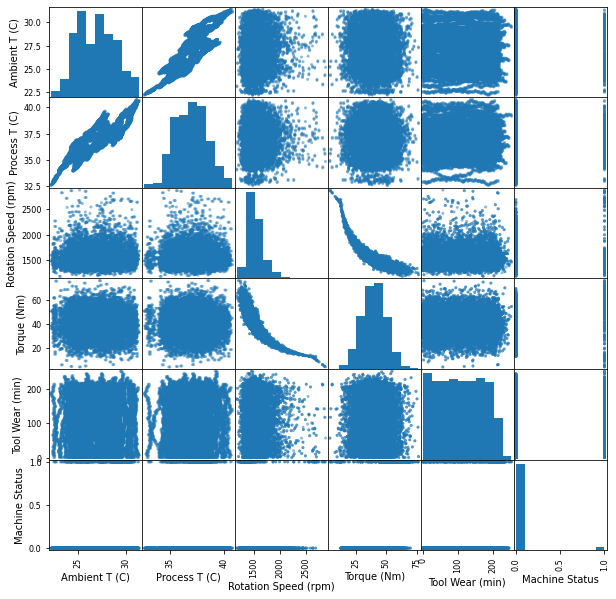

In [5]:
pd.plotting.scatter_matrix(factory_data, figsize=(10, 10))

# Imputing Factory Data #

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(factory_data.drop(['Machine Status'], axis=1), factory_data['Machine Status'],
test_size=0.3, random_state=42, stratify=factory_data['Machine Status'])

X_train = X_train.reset_index()
X_test = X_test.reset_index()

In [7]:
factory_productID = []
factory_Impute = {
        'Quality': {'K': [], 'S': [], 'T': [], 'Z': []},
        'Process T (C)': {'K': [], 'S': [], 'T': [], 'Z': []},
        'Rotation Speed (rpm)': {'K': [], 'S': [], 'T': [], 'Z': []}
    }

for i in X_train['Product ID']:
    factory_productID.append(i[0])

factory_productID = np.unique(factory_productID)

for i in X_train.loc[:, ('Product ID', 'Quality', 'Process T (C)', 'Rotation Speed (rpm)')].dropna().values:
    for j in factory_productID:
        if(i[0][0] == j):
            factory_Impute['Quality'][j].append(i[1])
            factory_Impute['Process T (C)'][j].append(i[2])
            factory_Impute['Rotation Speed (rpm)'][j].append(i[3])

for i in factory_Impute:
    for j in factory_Impute[i]:
        if(i == 'Quality'):
            factory_Impute[i][j] = np.unique(factory_Impute[i][j], return_counts=True)[0][np.unique(factory_Impute[i][j], return_counts=True)[1].argmax()]
        else:
            factory_Impute[i][j] = np.mean(factory_Impute[i][j])

print(factory_Impute)

{'Quality': {'K': 'L', 'S': 'L', 'T': 'L', 'Z': 'L'}, 'Process T (C)': {'K': 36.87273590880304, 'S': 36.929196370706414, 'T': 36.91891296986116, 'Z': 36.88646173969914}, 'Rotation Speed (rpm)': {'K': 1534.5310322989233, 'S': 1537.6260531432274, 'T': 1539.016931933627, 'Z': 1540.9032047089602}}


In [8]:
def Imputer(data):
    factory_NaN_Index = {'Quality': [], 'Process T (C)': [], 'Rotation Speed (rpm)': []}
    
    for i in data.loc[:, ('Quality', 'Process T (C)', 'Rotation Speed (rpm)')]:
        factory_NaN_Index[i] = data[i][data[i].isna()].index
    
    for i in factory_NaN_Index:
        for j in factory_NaN_Index[i]:
            for x in factory_Impute:
                for y in factory_Impute[x]:
                    if(i == x):
                        if(data.iloc[j]['Product ID'][0] == y):
                            data[i].iloc[j] = factory_Impute[x][y]

In [9]:
Imputer(X_train)
Imputer(X_test)

print("X Train")
for i in X_train.columns:
    print(f'{i}: {len(X_train[X_train[i].isna() == True])}')

print()
print("X Test")
for i in X_test.columns:
    print(f'{i}: {len(X_test[X_test[i].isna() == True])}')

c:\Users\renne\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


X Train
Unique ID: 0
Product ID: 0
Quality: 0
Ambient T (C): 0
Process T (C): 0
Rotation Speed (rpm): 0
Torque (Nm): 0
Tool Wear (min): 0

X Test
Unique ID: 0
Product ID: 0
Quality: 0
Ambient T (C): 0
Process T (C): 0
Rotation Speed (rpm): 0
Torque (Nm): 0
Tool Wear (min): 0


In [10]:
X_train = pd.get_dummies(X_train, columns=['Quality'], drop_first=True)

X_test = pd.get_dummies(X_test, columns=['Quality'], drop_first=True)

# Training the Model (Factory_Data) #

I chose K Nearest Neighbors, Decision Tree and Logistic Regression because they are quite reliable

I chose SVC because I wanted to experiment because I know that support vector machines don't scale well to the number of samples

I chose ensemble methods like Ada Boost and Stacking because I wanted to know whether can I get a better performance

In [11]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import StandardScaler

from sklearn.dummy import DummyClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier

from sklearn.linear_model import LogisticRegression

from sklearn.svm import SVC

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import StackingClassifier

In [12]:
scaler = StandardScaler()

X_train = X_train.drop(['Product ID'], axis=1)
X_test = X_test.drop(['Product ID'], axis=1)
scaler.fit(X_train)

factory_dataX = scaler.transform(X_train)
factory_dataXTest = scaler.transform(X_test)

dummyClass = DummyClassifier()

knnClass = KNeighborsClassifier()

treeClass = DecisionTreeClassifier()

logisticRegression = LogisticRegression()

svc = SVC()

adaBoostClass = AdaBoostClassifier(random_state=42)

estimators = [('knn', knnClass), ('tree', treeClass), ('logistic', logisticRegression), ('svc', svc)]
stackingClass = StackingClassifier(estimators=estimators)

When choosing the parameters for hyper-tuning, I looked at the documentation and picked the ones that I think would affect the model the most

The range of values I decided for the tuning was based on whether I thought the values would make a significant difference to the model when training it

In [13]:
knnParams = {'n_neighbors': np.linspace(1, 10, 10, dtype=int)}

treeParams = {'max_depth': np.linspace(1, 10, 10, dtype=int),
              'min_samples_split': np.linspace(2, 6, 5, dtype=int),
              'min_samples_leaf': np.linspace(1, 5, 5, dtype=int)}

svcParams = {'C': np.linspace(1, 10, 10)}

adaBoostParams = {'base_estimator': [knnClass, treeClass, logisticRegression, svc], 'n_estimators': np.linspace(1, 15, 15, dtype=int),
'learning_rate': np.linspace(0.1, 1, 20)}
stackingParams = {'final_estimator': [knnClass, treeClass, logisticRegression, svc]}

In [14]:
knnGrid = GridSearchCV(knnClass, knnParams, cv=5)

treeGrid = GridSearchCV(treeClass, treeParams, cv=5)

svcGrid = GridSearchCV(svc, svcParams, cv=5)

adaBoostGrid = GridSearchCV(adaBoostClass, adaBoostParams, cv=5)
stackingGrid = GridSearchCV(stackingClass, stackingParams, cv=5)

In [15]:
dummyClass.fit(factory_dataX, y_train)

knnGrid.fit(factory_dataX, y_train)

treeGrid.fit(factory_dataX, y_train)

logisticRegression.fit(factory_dataX, y_train)

svcGrid.fit(factory_dataX, y_train)

adaBoostGrid.fit(factory_dataX, y_train)
stackingGrid.fit(factory_dataX, y_train)

c:\Users\renne\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 443, in fit
    return super().fit(X, y, sample_weight)
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 117, in fit
    self._validate_estimator()
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 460, in _validate_estimator
    raise ValueError("%s doesn't support sample_weight."
ValueError: KNeighborsClassifier doesn't support sample_weight.

  warnings.warn("Estimator fit failed. The s

GridSearchCV(cv=5,
             estimator=StackingClassifier(estimators=[('knn',
                                                       KNeighborsClassifier()),
                                                      ('tree',
                                                       DecisionTreeClassifier()),
                                                      ('logistic',
                                                       LogisticRegression()),
                                                      ('svc', SVC())]),
             param_grid={'final_estimator': [KNeighborsClassifier(),
                                             DecisionTreeClassifier(),
                                             LogisticRegression(), SVC()]})

In [16]:
print(f'Best Params knn: {knnGrid.best_params_}')

print(f'Best Params tree: {treeGrid.best_params_}')

print(f'Best Params SVC: {svcGrid.best_params_}')

print(f'Best Params Ada Boost: {adaBoostGrid.best_params_}')
print(f'Best Params Stacking: {stackingGrid.best_params_}')

Best Params knn: {'n_neighbors': 3}
Best Params tree: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 3}
Best Params SVC: {'C': 10.0}
Best Params Ada Boost: {'base_estimator': DecisionTreeClassifier(), 'learning_rate': 0.1, 'n_estimators': 1}
Best Params Stacking: {'final_estimator': LogisticRegression()}


In [17]:
dummyClass_Y_Pred = dummyClass.predict(factory_dataXTest)

knn_Y_pred = knnGrid.predict(factory_dataXTest)

tree_Y_pred = treeGrid.predict(factory_dataXTest)

logisticRegression_Y_pred = logisticRegression.predict(factory_dataXTest)

svc_Y_pred = svcGrid.predict(factory_dataXTest)

adaBoost_Y_pred = adaBoostGrid.predict(factory_dataXTest)
stacking_Y_pred = stackingGrid.predict(factory_dataXTest)

I evaluate the quality of my system by using Cross Val Score, Accuracy Score, Classification Report and Confusion Matrix

In [18]:
print(f'Cross Val Score for dummy classifier: {cross_val_score(dummyClass, factory_dataXTest, y_test)}')

print(f'Cross Val Score for knn: {cross_val_score(knnGrid, factory_dataXTest, y_test)}')

print(f'Cross Val Score for tree: {cross_val_score(treeGrid, factory_dataXTest, y_test)}')

print(f'Cross Val Score for logistic regression: {cross_val_score(logisticRegression, factory_dataXTest, y_test)}')

print(f'Cross Val Score for SVC: {cross_val_score(svcGrid, factory_dataXTest, y_test)}')

print(f'Cross Val Score for Ada Boosting: {cross_val_score(adaBoostGrid, factory_dataXTest, y_test, cv=3)}')
print(f'Cross Val Score for Stacking: {cross_val_score(stackingGrid, factory_dataXTest, y_test, cv=3)}')

Cross Val Score for dummy classifier: [0.96666667 0.96666667 0.96583333 0.96583333 0.96583333]
Cross Val Score for knn: [0.9725     0.96916667 0.97083333 0.97       0.97333333]
Cross Val Score for tree: [0.97583333 0.97916667 0.9725     0.98       0.9775    ]
Cross Val Score for logistic regression: [0.96666667 0.97083333 0.97166667 0.96666667 0.97166667]
Cross Val Score for SVC: [0.97583333 0.97666667 0.97666667 0.96916667 0.97916667]


c:\Users\renne\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 443, in fit
    return super().fit(X, y, sample_weight)
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 117, in fit
    self._validate_estimator()
  File "c:\Users\renne\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py", line 460, in _validate_estimator
    raise ValueError("%s doesn't support sample_weight."
ValueError: KNeighborsClassifier doesn't support sample_weight.

  warnings.warn("Estimator fit failed. The s

Cross Val Score for Ada Boosting: [0.9785 0.974  0.982 ]
Cross Val Score for Stacking: [0.977 0.974 0.98 ]


In [19]:
print(f'Accuracy score for dummy classifier: {accuracy_score(y_test, dummyClass_Y_Pred)}')

print(f'Accuracy score for knn: {accuracy_score(y_test, knn_Y_pred)}')

print(f'Accuracy score for tree: {accuracy_score(y_test, tree_Y_pred)}')

print(f'Accuracy score for logistic regression: {accuracy_score(y_test, logisticRegression_Y_pred)}')

print(f'Accuracy score for SVC: {accuracy_score(y_test, svc_Y_pred)}')

print(f'Accuracy score for Ada Boosting: {accuracy_score(y_test, adaBoost_Y_pred)}')
print(f'Accuracy score for Stacking: {accuracy_score(y_test, stacking_Y_pred)}')

Accuracy score for dummy classifier: 0.9661666666666666
Accuracy score for knn: 0.9721666666666666
Accuracy score for tree: 0.9886666666666667
Accuracy score for logistic regression: 0.9703333333333334
Accuracy score for SVC: 0.9793333333333333
Accuracy score for Ada Boosting: 0.989
Accuracy score for Stacking: 0.9881666666666666


In [20]:
print(f'Classification report for dummy classifier: {classification_report(y_test, dummyClass_Y_Pred)}')

print(f'Classification report for knn: {classification_report(y_test, knn_Y_pred)}')

print(f'Classification report for tree: {classification_report(y_test, tree_Y_pred)}')

print(f'Classification report for logistic regression: {classification_report(y_test, logisticRegression_Y_pred)}')

print(f'Classification report for SVC: {classification_report(y_test, svc_Y_pred)}')

print(f'Classification report for Ada Boosting: {classification_report(y_test, adaBoost_Y_pred)}')
print(f'Classification report for Stacking: {classification_report(y_test, stacking_Y_pred)}')

Classification report for dummy classifier:               precision    recall  f1-score   support

           0       0.97      1.00      0.98      5797
           1       0.00      0.00      0.00       203

    accuracy                           0.97      6000
   macro avg       0.48      0.50      0.49      6000
weighted avg       0.93      0.97      0.95      6000

Classification report for knn:               precision    recall  f1-score   support

           0       0.98      0.99      0.99      5797
           1       0.67      0.34      0.46       203

    accuracy                           0.97      6000
   macro avg       0.83      0.67      0.72      6000
weighted avg       0.97      0.97      0.97      6000

Classification report for tree:               precision    recall  f1-score   support

           0       0.99      1.00      0.99      5797
           1       0.88      0.77      0.82       203

    accuracy                           0.99      6000
   macro avg       0.

c:\Users\renne\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\renne\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\renne\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [21]:
print(f'Confusion matrix for dummy classifier: {confusion_matrix(y_test, dummyClass_Y_Pred)}')

print(f'Confusion matrix for knn: {confusion_matrix(y_test, knn_Y_pred)}')

print(f'Confusion matrix for tree: {confusion_matrix(y_test, tree_Y_pred)}')

print(f'Confusion matrix for logistic regression: {confusion_matrix(y_test, logisticRegression_Y_pred)}')

print(f'Confusion matrix for SVC: {confusion_matrix(y_test, svc_Y_pred)}')

print(f'Confusion matrix for Ada Boosting: {confusion_matrix(y_test, adaBoost_Y_pred)}')
print(f'Confusion matrix for Stacking: {confusion_matrix(y_test, stacking_Y_pred)}')

Confusion matrix for dummy classifier: [[5797    0]
 [ 203    0]]
Confusion matrix for knn: [[5763   34]
 [ 133   70]]
Confusion matrix for tree: [[5775   22]
 [  46  157]]
Confusion matrix for logistic regression: [[5782   15]
 [ 163   40]]
Confusion matrix for SVC: [[5778   19]
 [ 105   98]]
Confusion matrix for Ada Boosting: [[5762   35]
 [  31  172]]
Confusion matrix for Stacking: [[5770   27]
 [  44  159]]


Even with the dummy classifier, it still has quite good accuracy score but not as good as compared to the other models. But from the confusion matrix, it has such a good accuracy score is because it guessed all machines as not broken

It seems that for most models, they have a problem with predicting whether a machine is actually broken. It can be from the fact that the data is not distributed evenly in the first place, having more non broken machines than broken machines